In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
from swmm_api import read_out_file
import os
from matplotlib.gridspec import GridSpec

from matplotlib import rcParams

config = {
            "font.family": 'serif',
            "font.size": 12,# 相当于小四大小
            "mathtext.fontset": 'stix',#matplotlib渲染数学字体时使用的字体，和Times New Roman差别不大
            "font.serif": ['Arial'],#['Times New Roman'],#宋体
            'axes.unicode_minus': False # 处理负号，即-号
         }
rcParams.update(config)

In [2]:
realrainid = [10,20,30,40,50,60]
exrainid = [1,2,3,4]
rainid = realrainid + exrainid
print(rainid,exrainid)

[10, 20, 30, 40, 50, 60, 1, 2, 3, 4] [1, 2, 3, 4]


# Load results files

In [3]:
results_PPO = {}
results_PPO_preK1, results_PPO_KGK1 = {}, {}
results_PPO_preK2, results_PPO_KGK2 = {}, {},
results_PPO_preK3, results_PPO_KGK3 = {}, {},
results_PPO_preK2, results_PPO_KGK2 = {}, {},
results_PPO_preK123, results_PPO_KGK123 = {}, {},
results_BC, results_DN = {}, {}
results_BC2, results_DN2 = {}, {}

for i in range(len(realrainid)):
    results_BC['rain'+str(rainid[i])] = np.load('./step0-knowledge/BC_results/bc_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_DN['rain'+str(rainid[i])] = np.load('./step0-knowledge/DN_results/dn_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_DN2['rain'+str(rainid[i])] = np.load('./step0-knowledge/DNv2_results/dnv2_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_BC2['rain'+str(rainid[i])] = np.load('./step0-knowledge/BC2_results/bc2_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    
    results_PPO['rain'+str(rainid[i])] = np.load('./step3-LFS/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_preK1['rain'+str(rainid[i])] = np.load('./step1-pretrainK1/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK1['rain'+str(rainid[i])] = np.load('./step2-finetuneK1/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_preK2['rain'+str(rainid[i])] = np.load('./step1-pretrainK3/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK2['rain'+str(rainid[i])] = np.load('./step2-finetuneK3/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_preK3['rain'+str(rainid[i])] = np.load('./step1-pretrainK3/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK3['rain'+str(rainid[i])] = np.load('./step2-finetuneK3/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_preK123['rain'+str(rainid[i])] = np.load('./step1-pretrainK123/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK123['rain'+str(rainid[i])] = np.load('./step2-finetuneK123/results/ppo_results_rain'+str(rainid[i])+'.npy',allow_pickle=True).tolist()

for i in range(len(exrainid)):
    results_BC['rain'+str(exrainid[i])] = np.load('./step0-knowledge/BC_results/real_bc_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_DN['rain'+str(exrainid[i])] = np.load('./step0-knowledge/DN_results/real_dn_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_DN2['rain'+str(exrainid[i])] = np.load('./step0-knowledge/DNv2_results/real_dnv2_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_BC2['rain'+str(exrainid[i])] = np.load('./step0-knowledge/BC2_results/real_bc2_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    
    results_PPO['rain'+str(exrainid[i])] = np.load('./step3-LFS/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_preK1['rain'+str(exrainid[i])] = np.load('./step1-pretrainK1/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK1['rain'+str(exrainid[i])] = np.load('./step2-finetuneK1/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_preK2['rain'+str(exrainid[i])] = np.load('./step1-pretrainK3/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK2['rain'+str(exrainid[i])] = np.load('./step2-finetuneK3/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_preK3['rain'+str(exrainid[i])] = np.load('./step1-pretrainK3/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK3['rain'+str(exrainid[i])] = np.load('./step2-finetuneK3/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_preK123['rain'+str(exrainid[i])] = np.load('./step1-pretrainK123/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()
    results_PPO_KGK123['rain'+str(exrainid[i])] = np.load('./step2-finetuneK123/results/real_ppo_results_rain'+str(exrainid[i]-1)+'.npy',allow_pickle=True).tolist()


## 统计调整orifice次数

In [4]:
def count(data):
    con = 0
    for i in range(1,data.shape[0]):
        if data[i]!=data[i-1]:
            con += 1
    return con

In [10]:
def sum_count_PPO(rid):
    BCcon = 7
    PPOcon,PPOprecon1,PPOprecon2,PPOprecon3,PPOprecon123 = 7, 7, 7, 7, 7
    PPOKGcon1,PPOKGcon2,PPOKGcon3, PPOKGcon123 = 7,7,7,7
    for k in range(7):
        BCcon+=count(np.array(results_DN['rain'+rid]['action'])[:,k])
        PPOcon+=count(np.array(results_PPO['rain'+rid]['action'])[:,k])
        
        PPOprecon1+=count(np.array(results_PPO_preK1['rain'+rid]['action'])[:,k])
        PPOprecon2+=count(np.array(results_PPO_preK2['rain'+rid]['action'])[:,k])
        PPOprecon3+=count(np.array(results_PPO_preK3['rain'+rid]['action'])[:,k])
        PPOprecon123+=count(np.array(results_PPO_preK123['rain'+rid]['action'])[:,k])

        PPOKGcon1+=count(np.array(results_PPO_KGK1['rain'+rid]['action'])[:,k])
        PPOKGcon2+=count(np.array(results_PPO_KGK2['rain'+rid]['action'])[:,k])
        PPOKGcon3+=count(np.array(results_PPO_KGK3['rain'+rid]['action'])[:,k])
        PPOKGcon123+=count(np.array(results_PPO_KGK123['rain'+rid]['action'])[:,k])
        
    #print(BCcon,EFDcon,OPTcon,DQNnosafecon,DQNcon,DQNprecon,DQNKGcon,PPOnosafecon,PPOcon,PPOprecon,PPOKGcon)
    return [BCcon,PPOcon,PPOKGcon1,PPOKGcon2,PPOKGcon3, PPOKGcon123]

result = {}
for rid in rainid:
    result['Rain'+str(rid)]=sum_count_PPO(str(rid))

result = pd.DataFrame(result,index=['BC','PPO','KG-PPO1','KG-PPO2','KG-PPO3','KG-PPO123'])
result.to_csv('table_fre_PPO.csv')
pd.DataFrame(result)


,Rain10,Rain20,Rain30,Rain40,Rain50,Rain60,Rain1,Rain2,Rain3,Rain4
BC,74,47,67,41,47,41,65,53,59,67
PPO,163,152,157,164,139,139,142,133,141,160
KG-PPO1,49,43,35,32,33,54,77,76,59,57
KG-PPO2,142,119,122,132,118,146,153,148,124,180
KG-PPO3,142,119,122,132,118,146,153,148,124,180
KG-PPO123,37,41,33,29,27,53,113,99,83,107


In [9]:
def sum_time_PPO(rid):
    DNcon = 7
    PPOcon,PPOprecon1,PPOprecon2,PPOprecon3,PPOprecon123 = 0, 0, 0, 0, 0
    PPOKGcon1,PPOKGcon2,PPOKGcon3, PPOKGcon123 = 0, 0, 0, 0
    for k in range(7):
        #DNcon+=count(np.array(results_DN['rain'+rid]['action'])[:,k])
        PPOcon+=np.sum(np.array(results_PPO['rain'+rid]['action'])[:,k])
        
        PPOprecon1+=np.sum(np.array(results_PPO_preK1['rain'+rid]['action'])[:,k])
        PPOprecon2+=np.sum(np.array(results_PPO_preK2['rain'+rid]['action'])[:,k])
        PPOprecon3+=np.sum(np.array(results_PPO_preK3['rain'+rid]['action'])[:,k])
        PPOprecon123+=np.sum(np.array(results_PPO_preK123['rain'+rid]['action'])[:,k])

        PPOKGcon1+=np.sum(np.array(results_PPO_KGK1['rain'+rid]['action'])[:,k])
        PPOKGcon2+=np.sum(np.array(results_PPO_KGK2['rain'+rid]['action'])[:,k])
        PPOKGcon3+=np.sum(np.array(results_PPO_KGK3['rain'+rid]['action'])[:,k])
        PPOKGcon123+=np.sum(np.array(results_PPO_KGK123['rain'+rid]['action'])[:,k])
        
    #print(BCcon,EFDcon,OPTcon,DQNnosafecon,DQNcon,DQNprecon,DQNKGcon,PPOnosafecon,PPOcon,PPOprecon,PPOKGcon)
    return [PPOcon,PPOKGcon1,PPOKGcon2,PPOKGcon3, PPOKGcon123]

result = {}
for rid in rainid:
    result['Rain'+str(rid)]=sum_time_PPO(str(rid))

result = pd.DataFrame(result,index=['PPO','KG-PPO1','KG-PPO2','KG-PPO3','KG-PPO123'])
result.to_csv('table_opentime_PPO.csv')
pd.DataFrame(result)

,Rain10,Rain20,Rain30,Rain40,Rain50,Rain60,Rain1,Rain2,Rain3,Rain4
PPO,151,151,144,149,151,155,138,157,152,151
KG-PPO1,25,21,18,17,21,26,46,46,53,64
KG-PPO2,129,129,136,124,119,129,169,141,106,167
KG-PPO3,129,129,136,124,119,129,169,141,106,167
KG-PPO123,22,28,16,11,17,35,87,77,55,82


## Figure，所有降雨所有orifice的流量分别做图

## In paper

In [11]:
title_font = {'size':'18'}
title_font2 = {'size':'22'}

def fig(k,rid):
    
    fig = plt.figure(dpi=100,constrained_layout=True,
                 figsize=(10,10)
                )
                #constrained_layout=True,#类似于tight_layout，使得各子图之间的距离自动调整【类似excel中行宽根据内容自适应】
    gs = GridSpec(4, 3, figure=fig)#GridSpec将fiure分为3行3列，每行三个axes，gs为一个matplotlib.gridspec.GridSpec对象，可灵活的切片figure

    #for kkd in result['Rain1'].index:
    #    if k != 'BC':
    #        plt.text(x=0.5,y=0.5, s=kkd + ': '+ str(result['Rain'+rid][kkd]), fontsize=15)

    ax = fig.add_subplot(gs[0, 2])
    ax.plot(np.array(results_PPO['rain'+rid]['action'])[:,k],label='PPO')
    ax.set_title('PPO',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['On','Off'])
    ax.set_xlabel('Time (minutes)',fontdict=title_font)

    ax = fig.add_subplot(gs[0, 0])
    ax.plot(np.array(results_PPO_preK1['rain'+rid]['action'])[:,k],label='pre-PPO-K1')
    ax.set_title('pre-PPO-K1',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    ax.set_ylabel('Opening (on/off)',fontdict=title_font)
    
    ax = fig.add_subplot(gs[1, 0])
    ax.plot(np.array(results_PPO_preK2['rain'+rid]['action'])[:,k],label='pre-PPO-K2')
    ax.set_title('pre-PPO-K2',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    ax.set_ylabel('Opening (on/off)',fontdict=title_font)
    
    ax = fig.add_subplot(gs[2, 0])
    ax.plot(np.array(results_PPO_preK3['rain'+rid]['action'])[:,k],label='pre-PPO-K3')
    ax.set_title('pre-PPO-K3',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    ax.set_ylabel('Opening (on/off)',fontdict=title_font)

    ax = fig.add_subplot(gs[3, 0])
    ax.plot(np.array(results_PPO_preK123['rain'+rid]['action'])[:,k],label='pre-PPO-K123')
    ax.set_title('pre-PPO-K123',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    ax.set_ylabel('Opening (on/off)',fontdict=title_font)
    ax.set_xlabel('Time (minutes)',fontdict=title_font)

    ax = fig.add_subplot(gs[0, 1])
    ax.plot(np.array(results_PPO_KGK1['rain'+rid]['action'])[:,k],label='KF-PPO-K1')
    ax.set_title('KF-PPO-K1',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])

    ax = fig.add_subplot(gs[1, 1])
    ax.plot(np.array(results_PPO_KGK2['rain'+rid]['action'])[:,k],label='KF-PPO-K2')
    ax.set_title('KF-PPO-K2',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    
    ax = fig.add_subplot(gs[2, 1])
    ax.plot(np.array(results_PPO_KGK3['rain'+rid]['action'])[:,k],label='KF-PPO-K3')
    ax.set_title('KF-PPO-K3',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    
    ax = fig.add_subplot(gs[3, 1])
    ax.plot(np.array(results_PPO_KGK123['rain'+rid]['action'])[:,k],label='KF-PPO-K123')
    ax.set_title('KF-PPO-K123',fontdict=title_font2)
    ax.set_xticks([0,95/2,95],[0,240,480])
    ax.set_yticks([0,1],['Off','On'])
    ax.set_xlabel('Time (minutes)',fontdict=title_font)

    plt.savefig('./pump_fig/pump'+'_'+str(k)+'_'+rid+'.png',dpi=200)

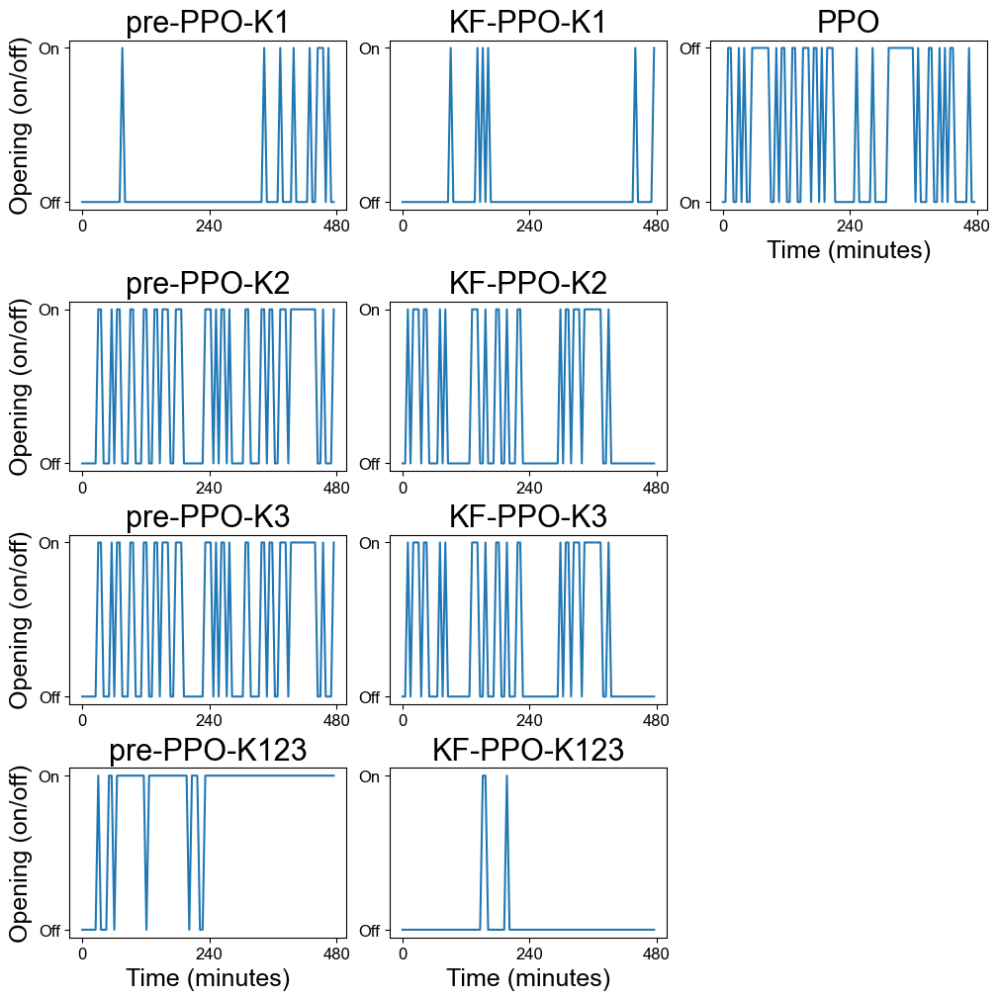

In [12]:
fig(2,str(rainid[0]))

C:\Users\chong\AppData\Local\Temp\ipykernel_11392\3595831876.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(dpi=100,constrained_layout=True,


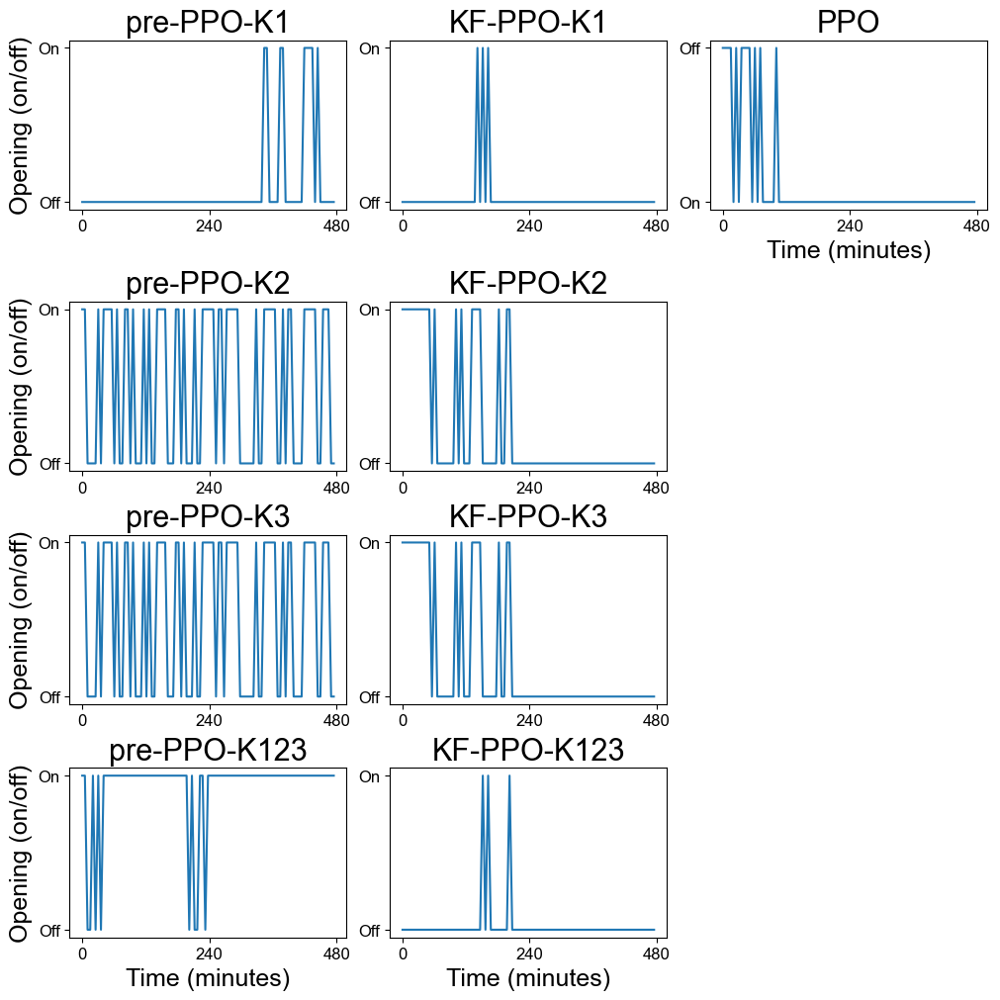

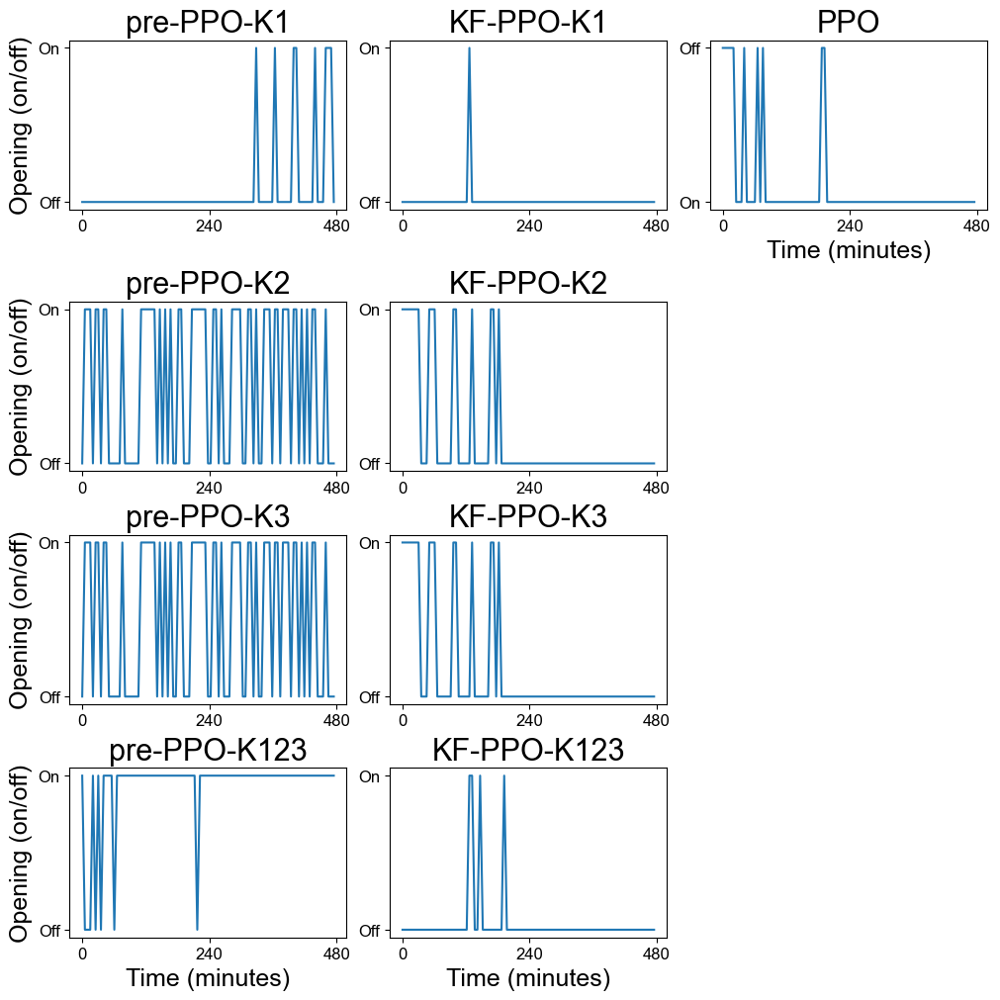

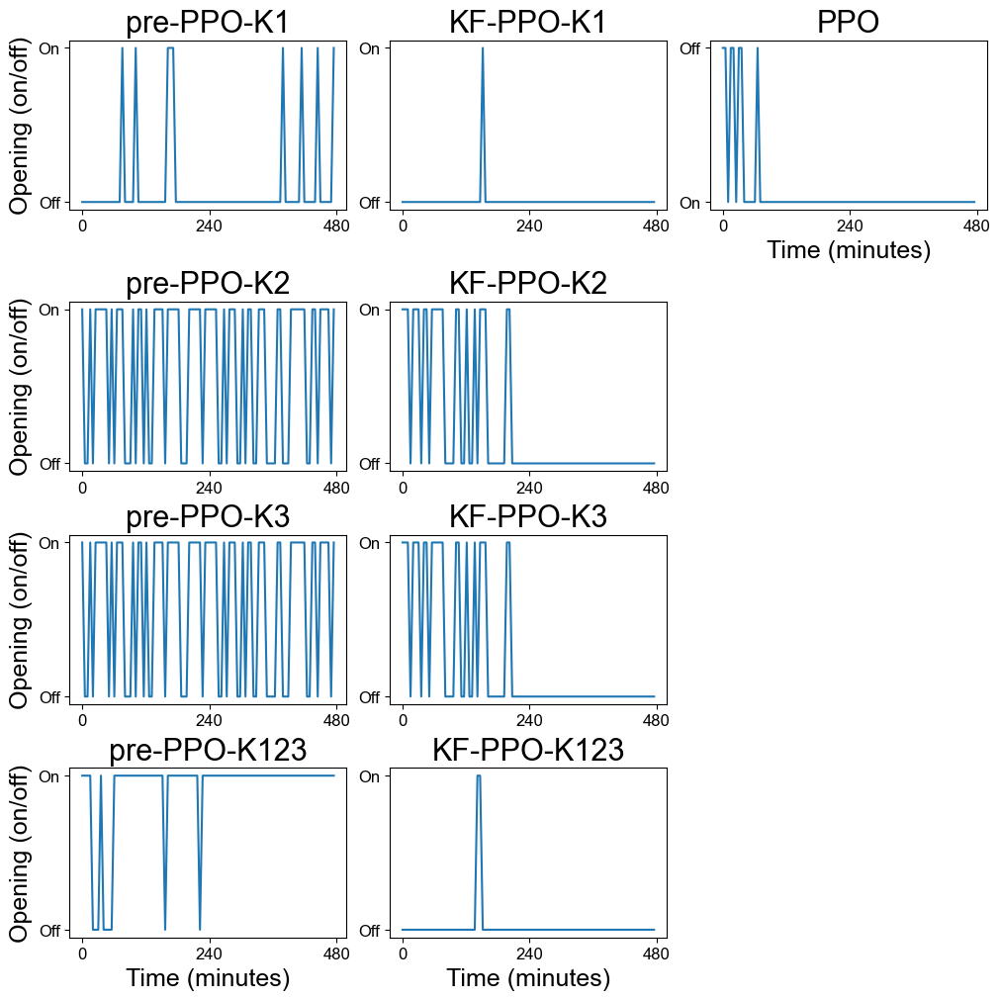

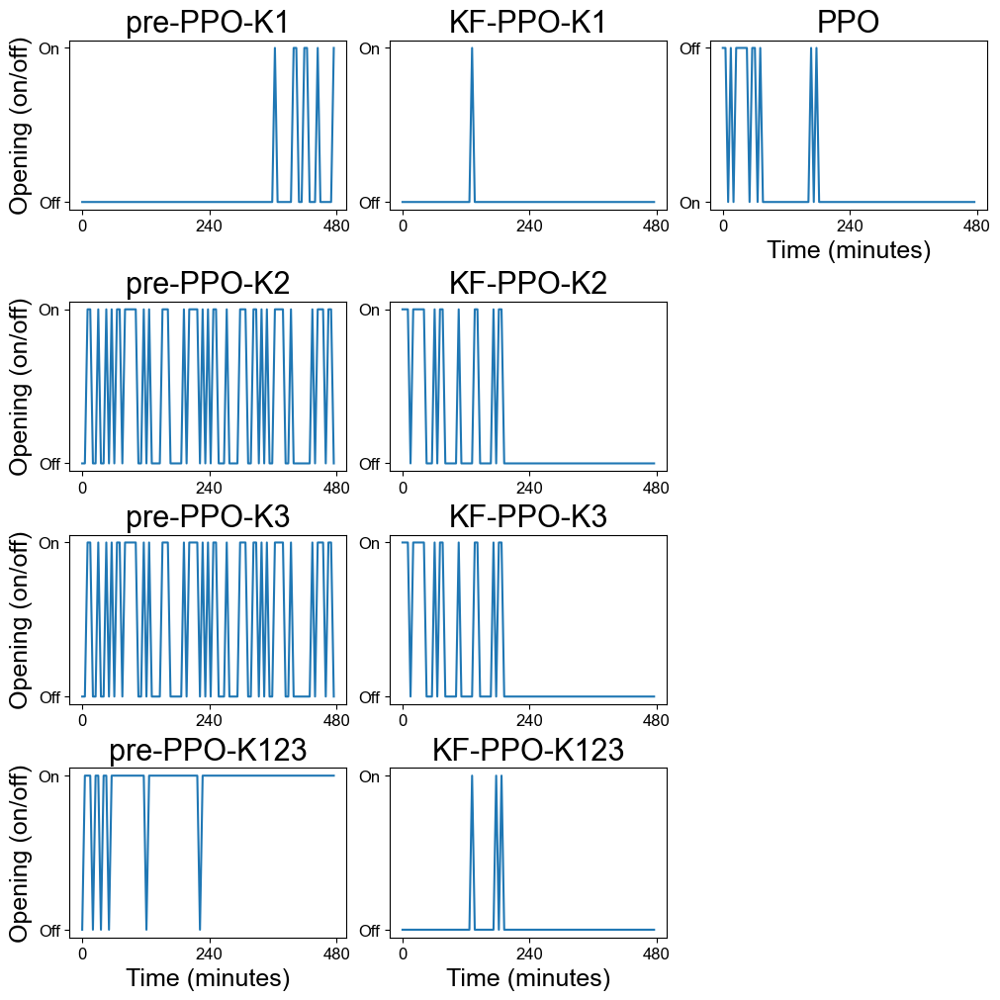

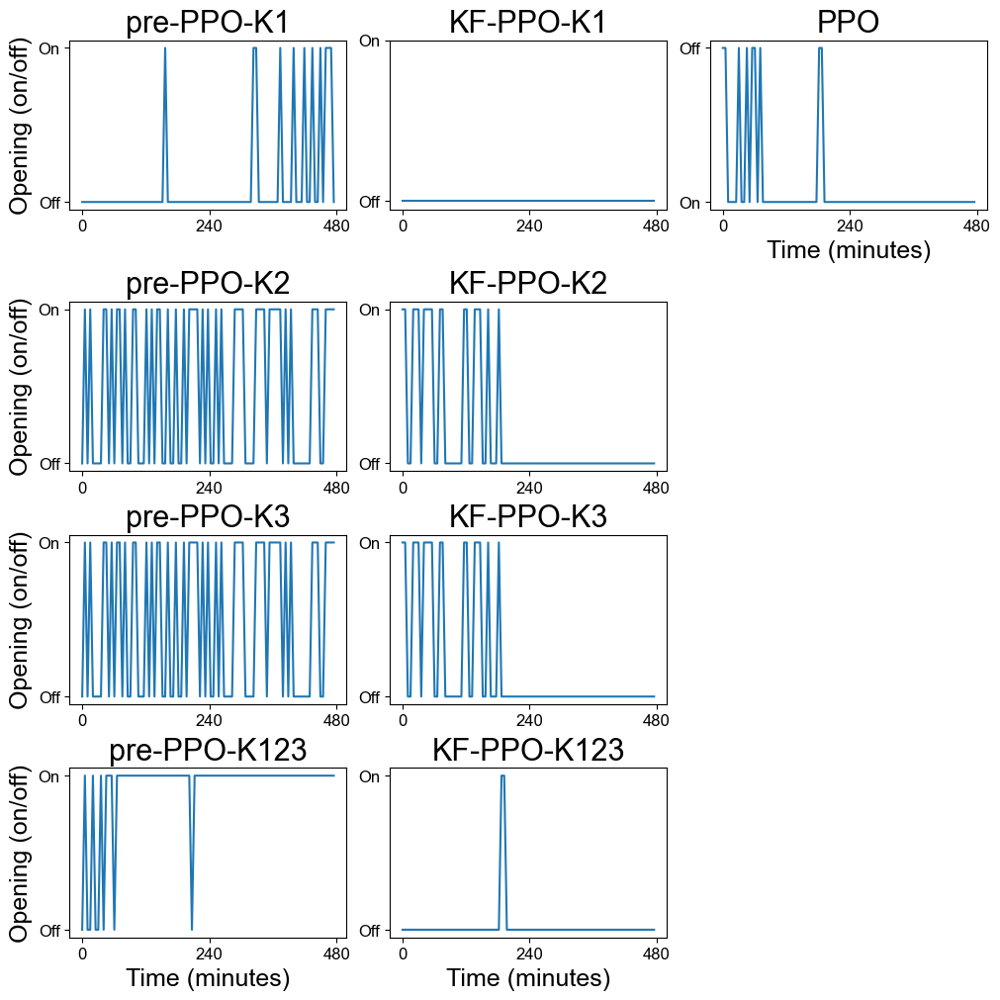

...

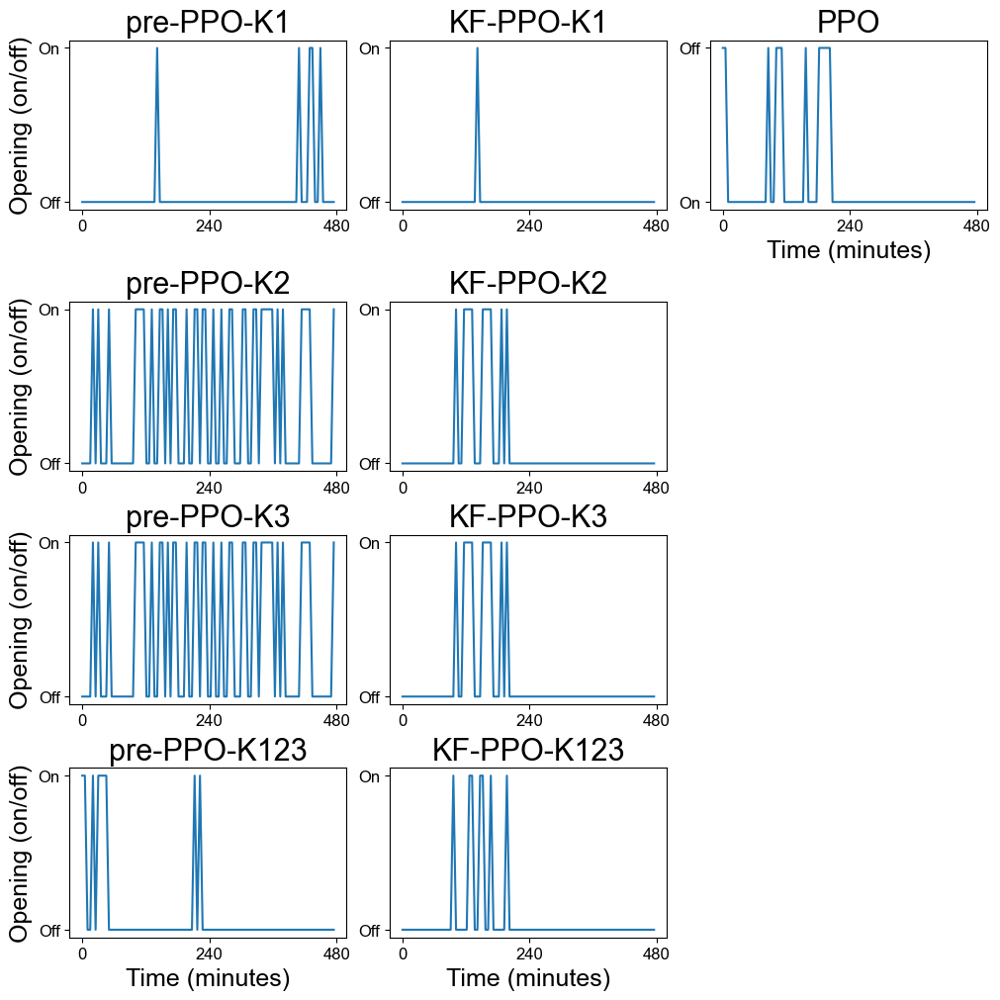

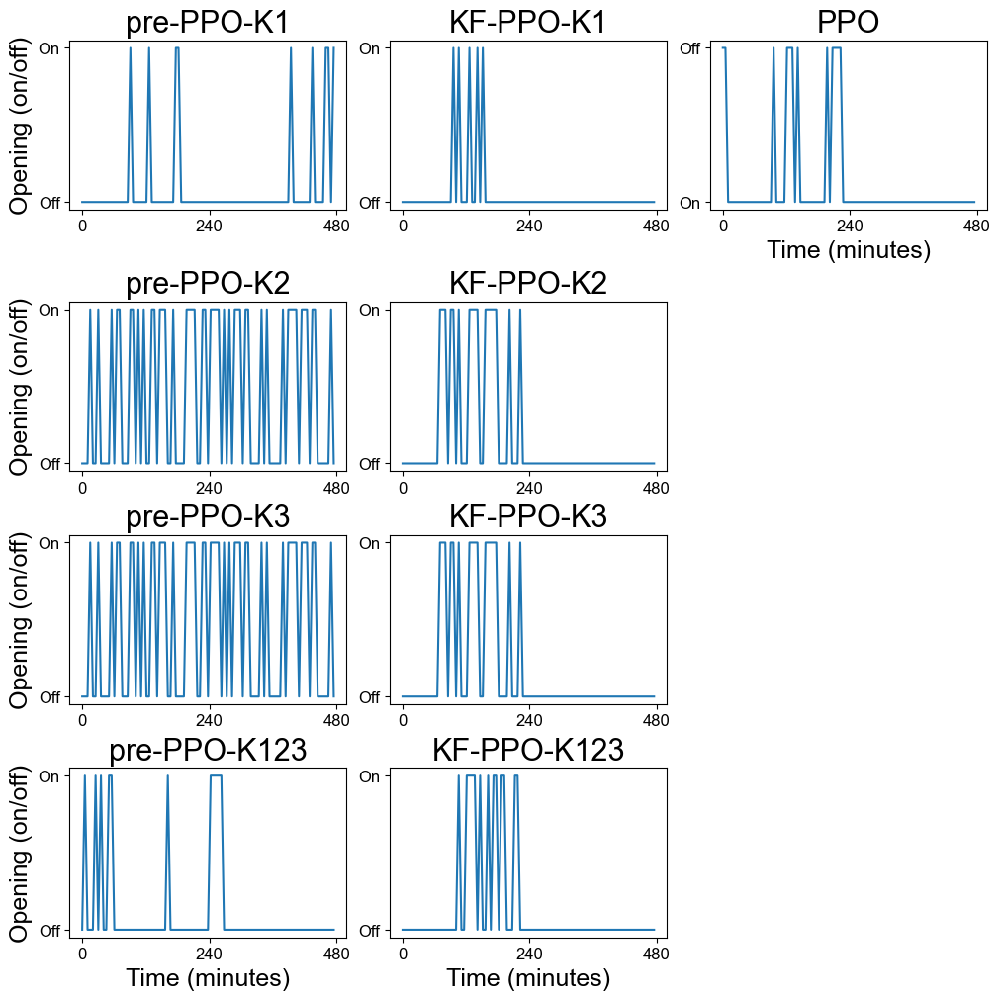

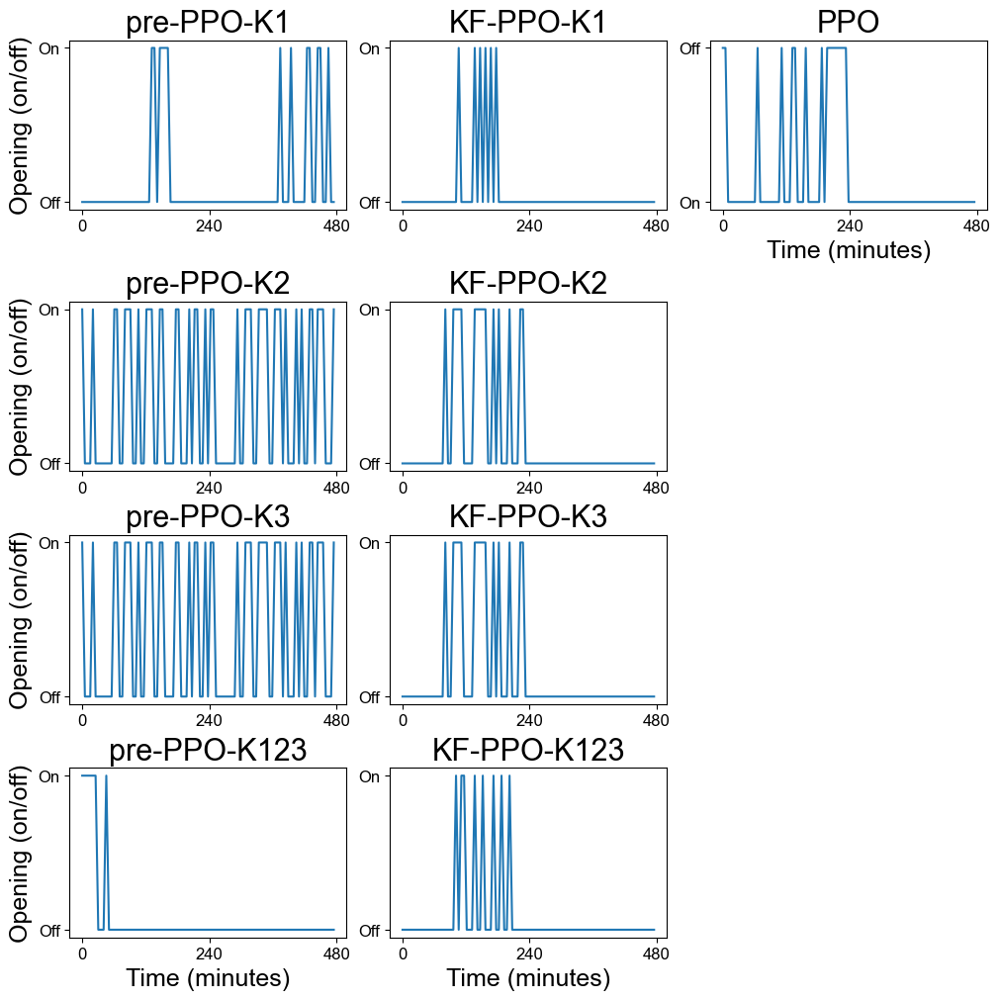

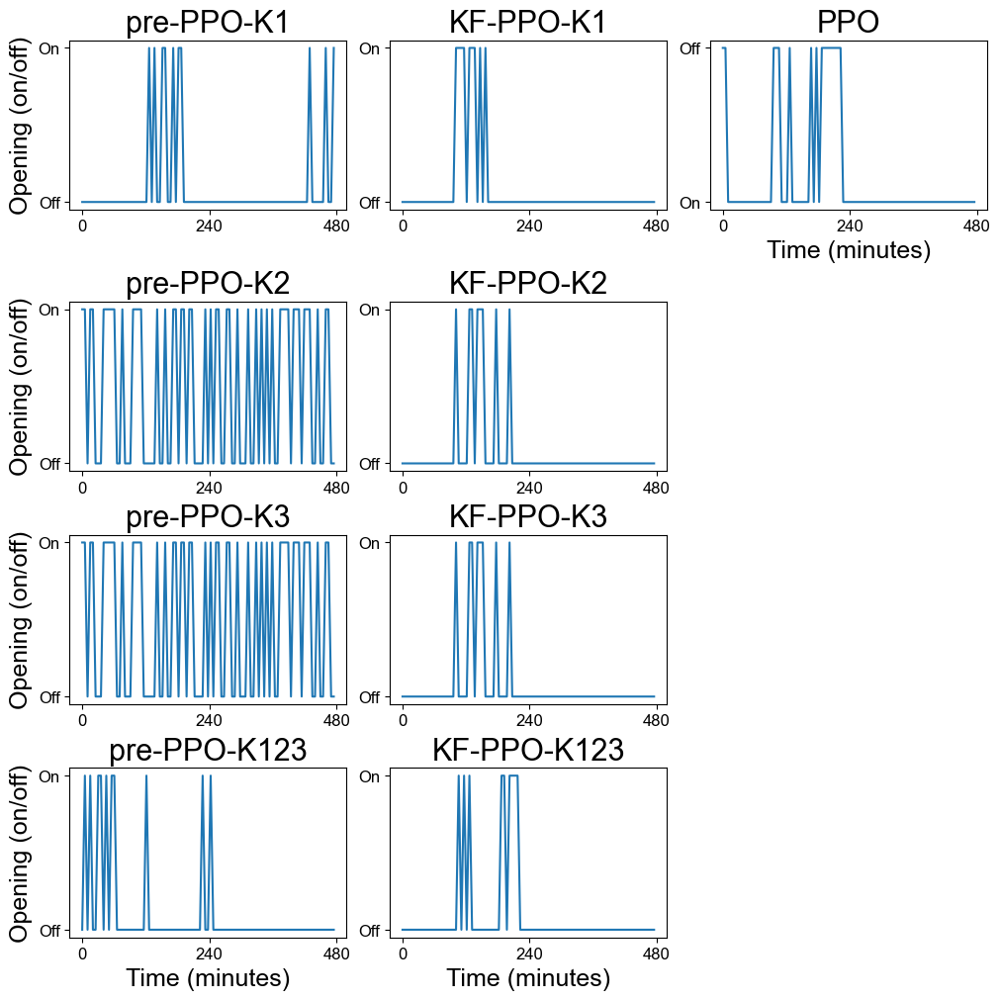

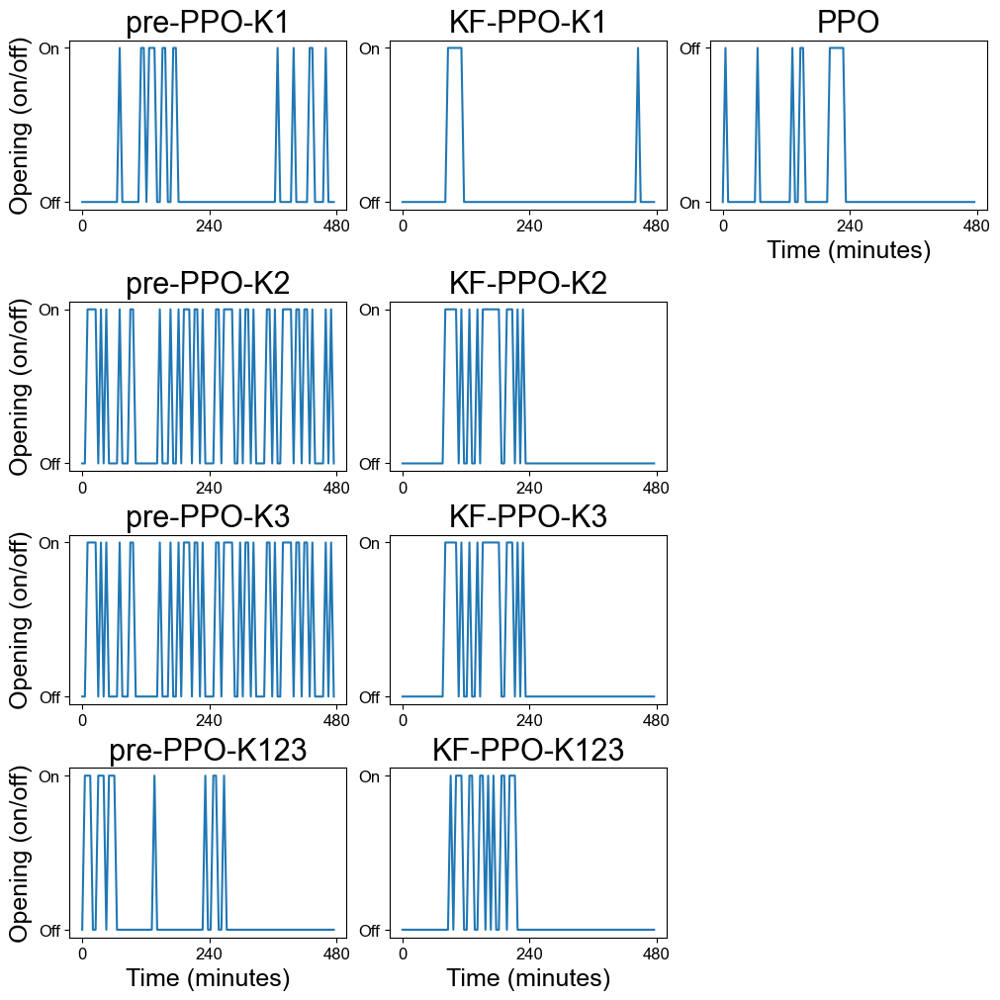

In [13]:
for k in range(7):
    for rid in rainid:
        fig(k,str(rid))

# Depth safety

In [14]:
k=6
i=1
#np.mean(np.array(results_BC['rain'+str(rainid[i])]['state'][1:])[:,k]),
#np.mean(np.array(results_EFD['rain'+str(rainid[i])]['state'][1:])[:,k]),
results = [
    [np.mean(np.array(results_DQN['rain'+str(rainid[i])]['state'][1:])[:,:k]),
    np.mean(np.array(results_DQN_pre['rain'+str(rainid[i])]['state'][1:])[:,:k]),
    np.mean(np.array(results_DQN_KG['rain'+str(rainid[i])]['state'][1:])[:,:k])],
    [np.mean(np.array(results_PPO['rain'+str(rainid[i])]['state'][1:])[:,:k]),
    np.mean(np.array(results_PPO_pre['rain'+str(rainid[i])]['state'][1:])[:,:k]),
    np.mean(np.array(results_PPO_KG['rain'+str(rainid[i])]['state'][1:])[:,:k])]
]

print(results)

[[3.7526158297130765, 3.7421570919895433, 3.759955523480509], [3.7537135116358424, 3.682201647483338, 3.7604262733920586]]


In [ ]:
k=2
i=4
print('BC: ',np.mean(np.array(results_BC['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('EFD: ',np.mean(np.array(results_EFD['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('OPT: ',np.mean(np.array(results_OPT['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('DQN: ',np.mean(np.array(results_DQN['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('PPO: ',np.mean(np.array(results_PPO['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('DQN_pre: ',np.mean(np.array(results_DQN_pre['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('PPO_pre: ',np.mean(np.array(results_PPO_pre['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('DQN_KG: ',np.mean(np.array(results_DQN_KG['rain'+str(rainid[i])]['state'][1:])[:,k]))
print('PPO_KG: ',np.mean(np.array(results_PPO_KG['rain'+str(rainid[i])]['state'][1:])[:,k]))